# Life Expectancy Prediction and Analysis - What factors impact life span?
## Final Report

*95-885 Data Science and Big Data - Project 2: Adding Value via Machine Learning*

**Team 12<br>
Blake Tian (sixuant)<br>
Yuran Zhu (yuranz)**

![title](image.png)

Link for our presentation on YouTube: https://www.youtube.com/watch?v=vlG2MJ8gFGc&feature=youtu.be

### Content
[1. Introduction](#Introduction)<br>
[2. Data Collection & Preprocessing](#Data-Collection-&-Preprocessing)<br>
[3. Exploratory Data Analysis](#Exploratory-Data-Analysis)<br>
[4. Data Preparation](#Data-Preparation)<br>
[5. Regression Models](#Regression-Models)<br>
[6. Recommendations](#Recommendations)<br>
[7. Future Work](#Future-Work)

# Introduction

Life expectancy of humans has progressed sharply during the last 200 years. According to [Our World in Data](https://ourworldindata.org/life-expectancy#:~:text=The%20United%20Nations%20estimate%20a,any%20country%20back%20in%201950), average global life expectancy in 1800 is 29 years, the life expectancy grew to 46 years in 1950. It was not until 2015 when the global average life expectancy reached 71 years. A long path was taken for humans to live longer, and we are wondering what changes possibly triggers this growth. Considering individual health conditions, national development and healthcare focus, many factors may impact life expectancy, and it's vital for the world to identify relevant factors as well as their impacting mechanisms.

Even though the world’s average life expectancy reached 71 years, there is still a wide variation between countries. According to [Worldometer](https://www.worldometers.info/demographics/life-expectancy/), the average life expectancies ranges from 54.36 to 85.29 across all countries in 2020. In countries like Japan, Switzerland, and Singapore, the life expectancy is around 84 years, while in countries like Chad, Lesotho, and the Central African Republic, the life expectancy is only around 55 years. Even though the world is developing as a whole, there are a lot of countries lagging behind, fighting for longer and better living. There are still 35 countries, with billions of peoples, struggling with life expectancy around 55 to 65 years. We want to leverage on machine learning models with relevant features to help those 35 countries identify what would be the key development factors they should focus on in improving citizens’ life expectancy. 

## Overview of Project Goals
In this machine learning project, our team plans to use a combined dataset from the World Health Organization (WHO) and United Nations (UN) to predict life expectancy. With various immunization related factors, mortality factors, economic factors and social factors for 193 countries, we are inspired to investigate variables that affect life expectancy and uncover the correlations between them. 

### 1. Type of Learning

Within the three types of machine learning, supervised learning, unsupervised learning, reinforcement learning, our prediction problem is a **supervised learning** problem, and is in the category of **regression**. Therefore, we’ll explore predictive models to investigate the relationship between the life expectancy and available healthcare/economic/social factors.

### 2. Domain Definition

With reference to `P(T, E+ ΔE) > P(T, E)`, here goes our clarification for the life expectancy prediction problem. 
  - **Task T:** Predict the life expectancy for a given country
  - **Experience E:** Historical data for countries about health, economic and social factors, as well as life expectancy
  - **Performance measure P:** Root Mean Squared Error (RMSE) (R-Squared also for reference)
  
\begin{equation*}
RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^n (y_i - \hat{y_i})^2} 
\end{equation*}

\begin{equation*}
R^2 = 1 - \frac{RSS}{TSS} = 1 - \frac{\sum_{i=1}^n (y_i - \hat{y_i})^2}{\sum_{i=1}^n (y_i - \bar{y_i})^2}
\end{equation*}

    
The baseline model would be to use **simple summary statistics** to create predictions for the life span, such as the mean values of the independent variable (life expectancy) data. Our machine learning models will learn from the experience and improve the performance in the prediction problem.

### 3. Possible Findings and Implications

With the dataset, we can explore the following problems and learn insights from them.
- The impact of schooling on life expectancy. It can motivate governments, the UN, and related stakeholders to implement education-related policies and measures.
- Relationships between eating habits, lifestyles and the life span. It would provide data-driven insights and guidance for individuals to keep track of a healthy life.
- The impact of immunization coverage on life expectancy. It can inspire WHO and related organizations, governments to think about expanding the immunization coverage on certain diseases.

As the project completes, we came to reveal the relationships between life expectancy and various country-level factors, inspiring us to explore the direct pathway and useful measures for countries to help people appropriately live longer. Based on the **key findings**, we put forward recommendations and policy suggestions on making improvements in these aspects and will expand the content in the following analysis:
- `Healthcare development`
- `Human Development and welfare improvement`
- `Education promotion`
- `Global Support Program`

# Data Collection & Preprocessing

## 1. Data Collection

The data was collected from the WHO and the UN website and is available on [Kaggle](https://www.kaggle.com/kumarajarshi/life-expectancy-who). On the one hand, the Global Health Observatory under WHO keeps track of the life expectancy and other related health factors for all 193 countries across the years 2000 to 2015. On the other hand, the United Nations keeps track of economic data for all countries across the same time frame.

**Data Composition**

The dataset consists of **22 columns** and **2,938 rows**. Each row refers to a country, and each column refers to one country level health related or economic features. The health related features include `life expectancy, adult mortality, infant deaths, alcohol drinking, hepatitis B, measles, BMI, HIV/AIDS`, etc. The economic features include `development status, percentage expenditure, GDP, population, schooling`, etc. There are 2 columns that are object type, 4 columns that are integer type, and 16 columns that are float type. With initial data exploration, we find:
- The `life expectancy` column can be used as a dependent variable during our machine learning process.
- The `population` column has 22.2% missing values.
- The `Hepatitis B` columns have 18.8% missing values.
- The `GDP` has 15.2% missing values.
- There are also 13 other columns which have 0.3% - 6.6% of **missing values**.

To conclude, the data is not that clean and we need to perform more data exploration and preprocessing before feeding into the machine learning model.


## 2. Data Preprocessing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from plotnine import *
import plotly.express as px
import plotly.figure_factory as ff
import country_converter as coco
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint

import warnings
warnings.filterwarnings('ignore')

### 2.1 Load Data and Inspect

In [2]:
df = pd.read_csv('Life_expectancy_data.csv')
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [3]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

Some columns have trailing spaces, which should be removed for better column identifying. We'll also replace the inside spaces with underscores and rename some too-long columns.

### 2.2 Rename Columns and Change Data Type

In [4]:
# Remove trailing spaces, replace inside space with underscore
df.rename(columns=lambda x: x.strip().replace(' ', '_'), inplace=True)
df.columns

Index(['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality',
       'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
       'Measles', 'BMI', 'under-five_deaths', 'Polio', 'Total_expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness__1-19_years',
       'thinness_5-9_years', 'Income_composition_of_resources', 'Schooling'],
      dtype='object')

In [5]:
# Renaming some columns as they are too long and to follow consistent case order
df.rename(columns = {'Adult_Mortality': 'Adult_mortality', 'infant_deaths': 'Infant_deaths', 
                     'percentage_expenditure': 'Percentage_exp', 
                     'under-five_deaths': 'Under-five_deaths',
                     'Total_expenditure': 'Total_exp',
                     'thinness__1-19_years': 'Thinness_1to19_years', 
                     'thinness_5-9_years': 'Thinness_5to9_years',
                     'Income_composition_of_resources': 'Income_comp'}, inplace=True)
df.columns 

Index(['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_mortality',
       'Infant_deaths', 'Alcohol', 'Percentage_exp', 'Hepatitis_B', 'Measles',
       'BMI', 'Under-five_deaths', 'Polio', 'Total_exp', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'Thinness_1to19_years',
       'Thinness_5to9_years', 'Income_comp', 'Schooling'],
      dtype='object')

In [6]:
# Inspect data types and non-null values count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Country               2938 non-null   object 
 1   Year                  2938 non-null   int64  
 2   Status                2938 non-null   object 
 3   Life_expectancy       2928 non-null   float64
 4   Adult_mortality       2928 non-null   float64
 5   Infant_deaths         2938 non-null   int64  
 6   Alcohol               2744 non-null   float64
 7   Percentage_exp        2938 non-null   float64
 8   Hepatitis_B           2385 non-null   float64
 9   Measles               2938 non-null   int64  
 10  BMI                   2904 non-null   float64
 11  Under-five_deaths     2938 non-null   int64  
 12  Polio                 2919 non-null   float64
 13  Total_exp             2712 non-null   float64
 14  Diphtheria            2919 non-null   float64
 15  HIV/AIDS             

According to the data set description, the data types seems correct. We can also inspect on some basic statistics for columns in the dataset.

In [7]:
# Categorical variables
df.describe(exclude = np.number).transpose()

,count,unique,top,freq
Country,2938,193,Congo,16
Status,2938,2,Developing,2426


In [8]:
# Continuous variables
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life_expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult_mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
Infant_deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
Percentage_exp,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis_B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
Under-five_deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [9]:
# Export renamed dataset
cleaned_df = df
df.to_csv(r'cleaned_life_expectancy.csv', index = False)

# Exploratory Data Analysis

In the Exploratory Data Analysis (EDA), we mainly focus on analyze the data from the following aspects:
- The proportion of **andmissing values** for each column
- **Correlations** between all columns
- **Distributions** of some columns of interest
- Explore the difference between countries on **2015 life expectancy** via the world map

In this way, we can have a basic understanding of the dataset, providing us with ideas on data distribution and imputation methods, etc.

## 1. Missing Value

In [10]:
# Define missing plot to detect all missing values in dataset
def missing_plot(dataset, key) :
    '''
    Takes a dataset and key, calculates the count and % of missing values for each column
    Outputs a plot for highlight results
    '''
    null_feat = pd.DataFrame(dataset.isnull().sum(), columns = ['Count'])
    percentage_null = pd.DataFrame((len(dataset[key]) - (len(dataset[key]) - dataset.isnull().sum()))/len(dataset[key])*100, columns = ['Count'])
    percentage_null = percentage_null.round(2)

    trace = go.Bar(x = null_feat.index, y = null_feat['Count'] ,opacity = 0.8, 
                   text = percentage_null['Count'],  textposition = 'auto',
                   marker=dict(color = '#7EC0EE',
                   line=dict(color='#000000',width=1.5)))

    layout = dict(title =  "Missing Values (count & %)")

    fig = dict(data = [trace], layout=layout)
    fig['layout'].update(width=800, height=400)
    py.iplot(fig)

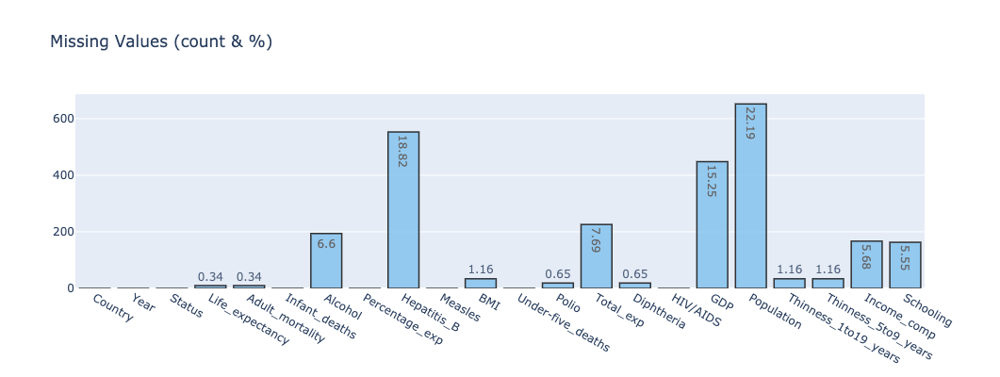

In [11]:
# Plotting 
missing_plot(df, 'Life_expectancy')

In total, 14 columns have missing values. Three columns `Hepatitis_B, GDP, Population` contain missing values that are over 10% of the entries. Considering the proportions are not too high, we won't simply drop those columns. Instead, we'll impute all those missing values in the `Data Preparation` section.

Meanwhile, we are also thinking about the reasons why those three columns have comparatively high proportion of missing values. We suppose that:
- `Hepatitis_B` is in the aspect of public health, for some rural countries, they may fail to test and record for it.
- Similarily, rural countries might miss data for `GDP` and `Population`.


## 2. Feature Correlation

Then we explore the correlations among all the columns.

Text(0.5, 1.0, 'Heatmap of Features Correlations')

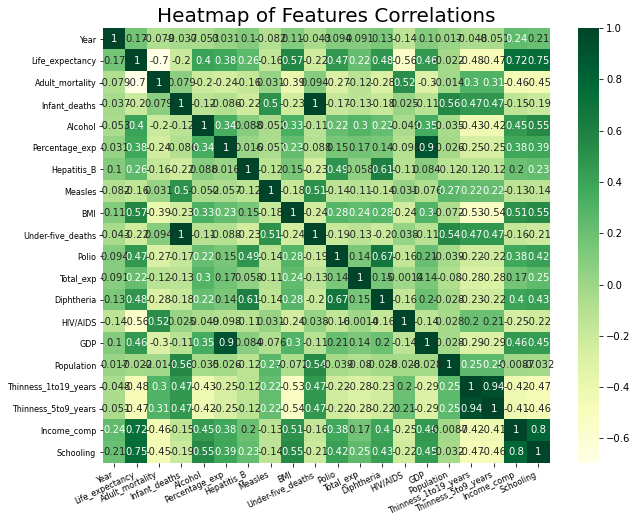

In [12]:
cor = df.corr()
# correlation plot---heatmap
plt.figure(figsize=(10,8))
g = sns.heatmap(cor,annot=True,cmap = "YlGn")
g.tick_params(labelsize=8)
g.set_xticklabels(g.get_xticklabels(), rotation=25, horizontalalignment='right')
plt.title('Heatmap of Features Correlations', fontsize = 20)

Generally, most of the correlation coefficients are below 0.6. Those columns display higher correlations:
- `Infant_deaths` and `Under-five_deaths`: 1.0
- `thinness_1to19_years` and `thinness_5to9_years`: 0.94
- `GDP` and `Percentage_exp`: 0.9
- `Income_comp` and `Schooling`: 0.8
- `Schooling` and `Life_expectancy`: 0.75
- `Income_comp` and `Life_expectancy`: 0.72
- `Polio` and `Diphtheria`: 0.67

It seems reasonable to detect the high positive correlations. For example, 
- In countries with higher schooling level, people are more educated and tend to understand as well as master the ways to keep healthy.
- For countries with higher  Gross Domestic Product (GDP), they may tend to spend more on healthcare, which leads to higher `Percentage_exp`.
- With higher `Income_comp` (A Human Development Index in terms of income composition of resources), countries tend to have longer average life expectancy due to better living standards and conditions.

Additionally, there are some notable high correlations between `life expectancy` and other variables:
- `Schooling`: 0.75
- `Income Comp`: 0.72
- `Adult mortality`: -0.7
- `BMI`: 0.57
- `HIV/AIDS`: -0.56

As well as low correlation between `life expectancy` and other variables:
 - `Population`: 0.022

## 3. Distribution

Besides and distribution for single column, we're also interested in the patterns of column distribution in relation to different life expectancy segments. 

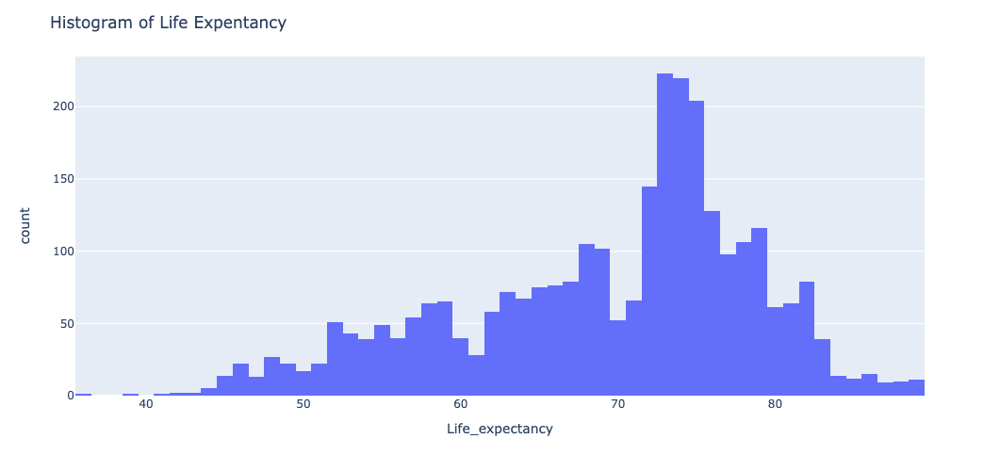

In [13]:
fig = px.histogram(df, x = 'Life_expectancy')
fig.update_layout(title_text = 'Histogram of Life Expentancy', width=1000, height=500,)
fig.show()

We mainly divide `Life_expectancy` into 5 segments: `Fifties_below, Fifties, Sixties, Seventies, Eighties_above`. 

In [14]:
# Divide 5 levels for Life_expectancy
Fifties_below = df.loc[(df['Life_expectancy'] >= 30) & (df['Life_expectancy'] < 50)]
Fifties = df.loc[(df['Life_expectancy'] >= 50) & (df['Life_expectancy'] < 60)]
Sixties = df.loc[(df['Life_expectancy'] >= 60) & (df['Life_expectancy'] < 70)]
Seventies = df.loc[(df['Life_expectancy'] >= 70) & (df['Life_expectancy'] < 80)]
Eighties_above = df.loc[(df['Life_expectancy'] >= 80) & (df['Life_expectancy'] < 90)]

In [15]:
def plot_distribution(data_select, size_bin):
    '''
    Takes in the column to visualize and the defined size of bin
    Outputs a density plot for the column grouped by different life_expectancy levels
    '''
    below_fif = Fifties_below[data_select].fillna(0).to_numpy()
    fif = Fifties[data_select].fillna(0).to_numpy()
    six = Sixties[data_select].fillna(0).to_numpy()
    seven = Seventies[data_select].fillna(0).to_numpy()
    eight_above = Eighties_above[data_select].fillna(0).to_numpy()

    age_ranges = [below_fif, fif, six, seven, eight_above] 
    group_labels = ['Fifties_below', 'Fifties', 'Sixties', 'Seventies', 'Eighties_above']
    colors = ['#DE172E', '#F58F00', '#E8D65E', '#C2D770', '#80BF22']

    fig = ff.create_distplot(age_ranges, group_labels, colors = colors, show_hist = True,\
                             bin_size = size_bin, curve_type='kde', show_rug = False)

    fig['layout'].update(width=700, height=350)
    fig.update_layout(title=data_select +' Distribution Plot')

    py.iplot(fig, filename = 'Density plot')

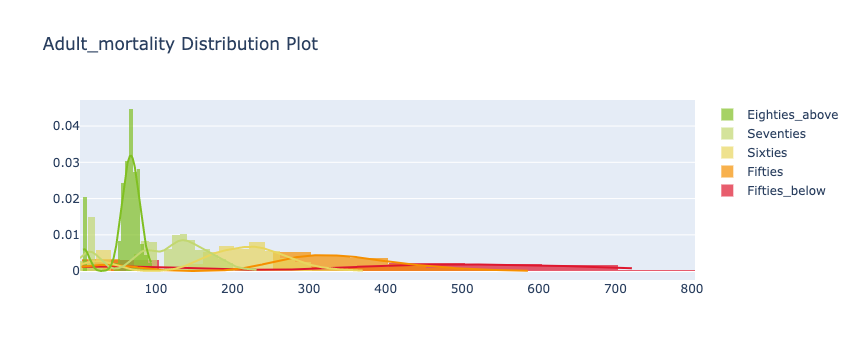

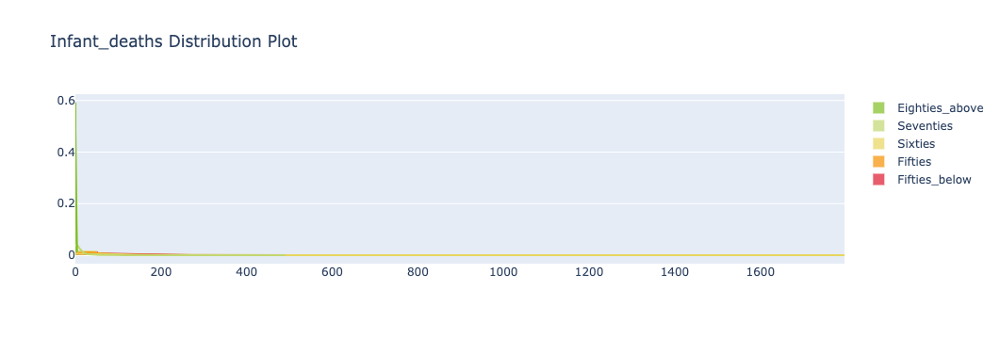

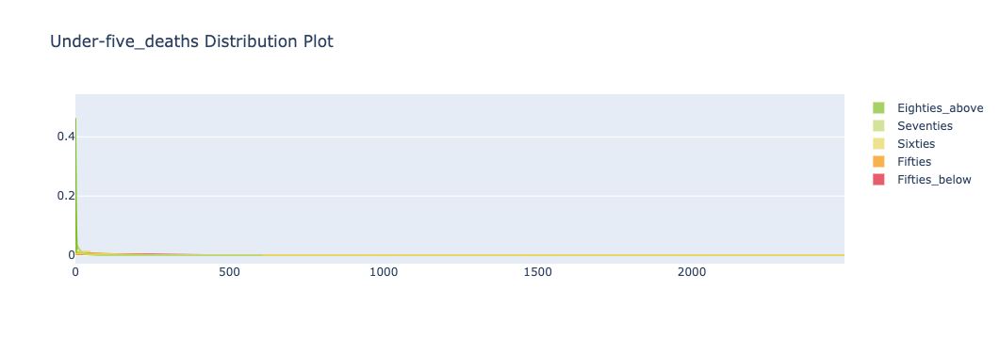

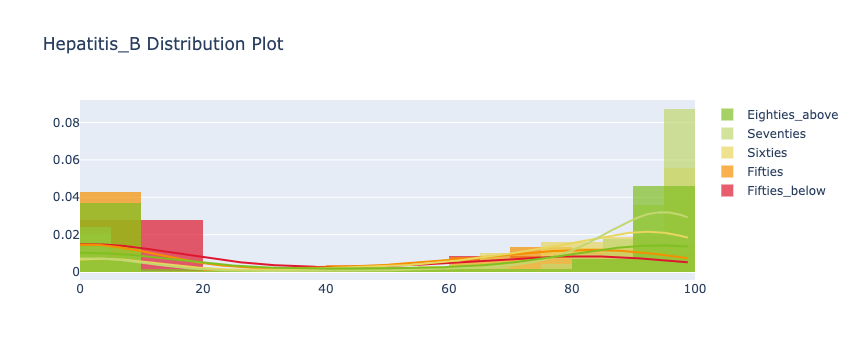

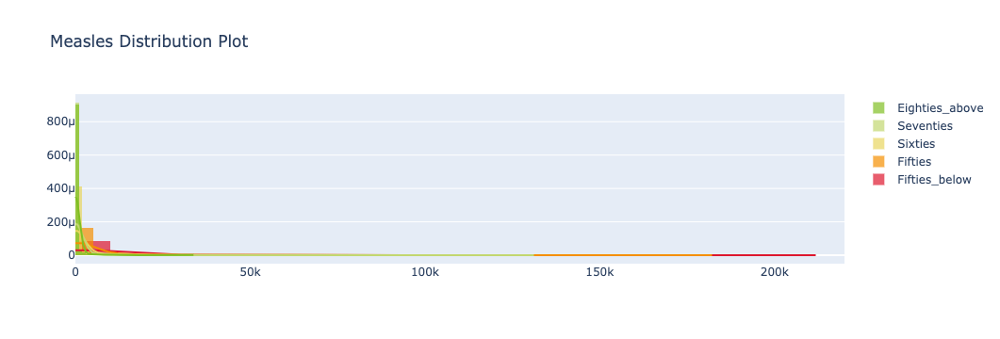

...

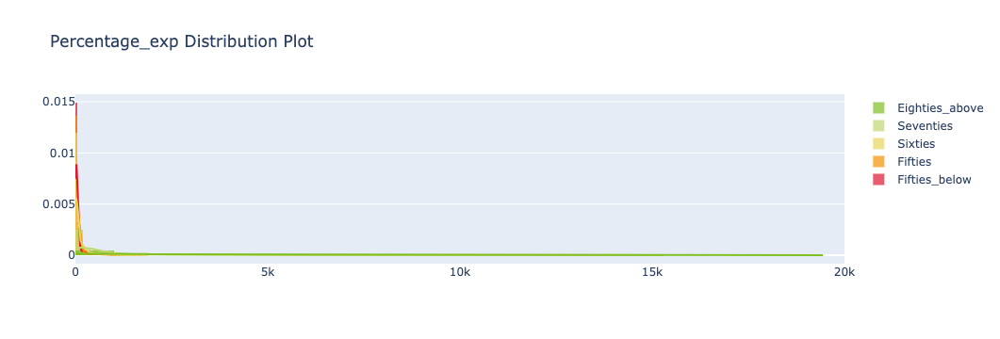

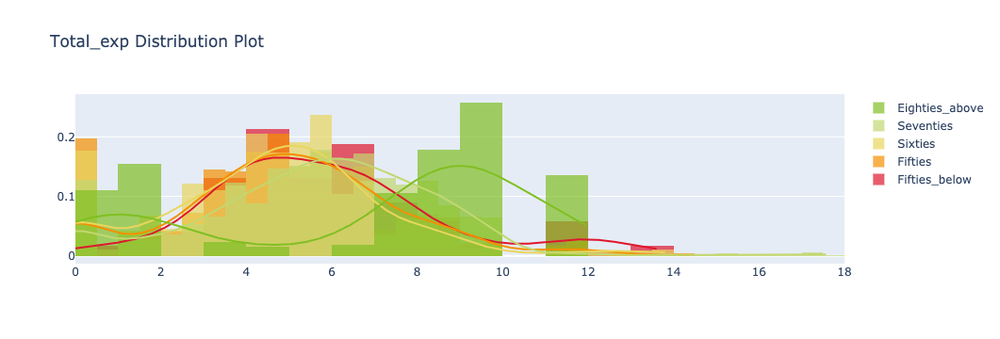

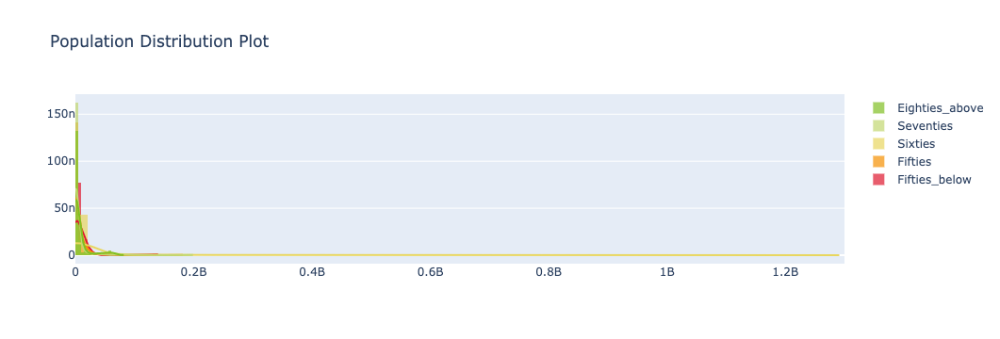

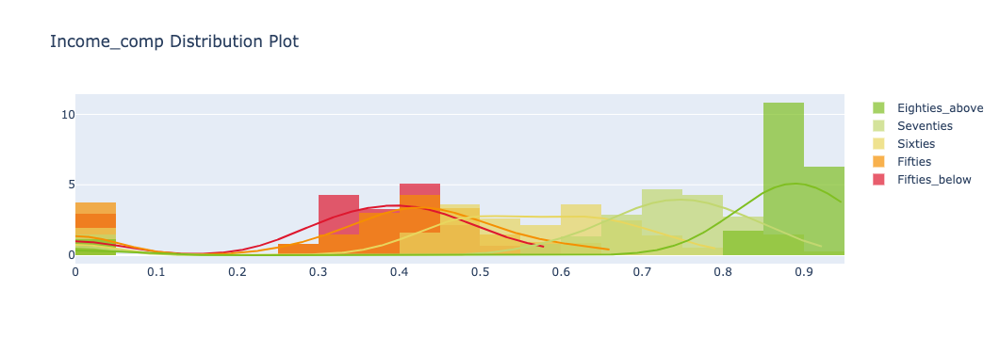

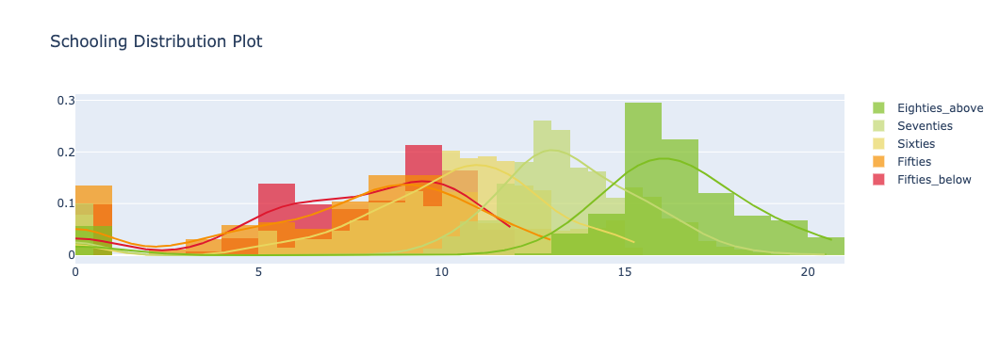

In [16]:
# Select features of interest
dist_plot_features = ['Adult_mortality', 'Infant_deaths', 'Under-five_deaths', 'Hepatitis_B', 'Measles', 'BMI', 
                      'Thinness_1to19_years', 'Polio', 'Diphtheria', 'HIV/AIDS', 'Alcohol',
                      'GDP', 'Percentage_exp', 'Total_exp', 'Population',  
                      'Income_comp', 'Schooling']

for features in dist_plot_features: 
    plot_distribution(features, 0) 

We can draw some intersting insights from the grouped distribution, such as:
- As the life expectancy level improves, the mode of `Adult_mortality` decreases
- The distributions of `Infant_deaths` and `Under-five_deaths` are similar: As the life expectancy level improves, countires tend to have more lower value of these two attributes
- `Fifties_below, Fifties, Sixties` group have similar mode of `BMI`, while `Seventies, Eighties_above` group have another similar mode.
- The distributions of `Polio`, `Diphtheria` and `Hepatitis_B` are similar: For countries with higher life expectancy level, more people are  with immunization of these three diseases.
- Groups display similar distributions of `Total_exp`, `GDP`, `Percentage_exp` except `Eighties_above`
- As the life expectancy level improves, the distribution of `Schooling` becomes much more like normal distribution

## 4. Map

Next, we plot the world choropleth map for countries' life expectancy in 2015.

In [17]:
# life expectancy as for 2015
df_2015 = df[df['Year'] == 2015] 
df_2015 = df_2015.reset_index()
df_2015 = df_2015[['Country', 'Life_expectancy']]
df_2015['Code'] = [coco.convert(names=n, to='ISO3', not_found=None) for n in df_2015['Country'].values]

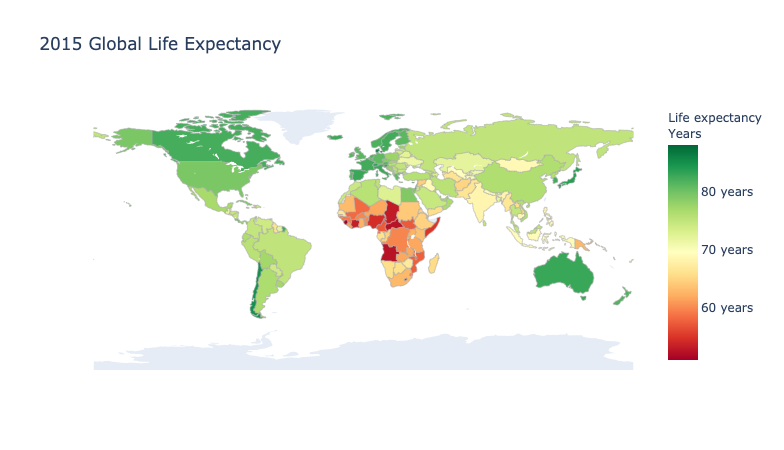

In [18]:
fig = go.Figure(data=go.Choropleth(
    locations = df_2015['Code'],
    z = df_2015['Life_expectancy'],
    text = df_2015['Country'],
    colorscale = 'RdYlGn',
    autocolorscale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_ticksuffix = ' years',
    colorbar_title = 'Life expectancy<br>Years',
))

fig.update_layout(
    title_text='2015 Global Life Expectancy',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    )
)

fig.show()

Here, we can notice the following pattern of life expectancy:
- Australia, European countries, and North America have the highest life expectancy in 2015
- South Amerian countries also show comparatively higher values of life expectancy 
- Most of the Asian countries have medium level of life expectancy in 2015
- African countries tend to have comparatively low life expectancy

This is kind of intuitive due to the developing disparity in terms of economics, technology, healthcare, etc.


# Data Preparation

## 1. Data Imputaion

For numeric columns, some of them have **missing values**. Since the proportions of missing values are comparatively low, it's not appropriate to drop the whole column. Thereby, we'll impute those missing values. The way we are using to impute the missing values is to fill them with the **median values** of the column for different countries. More specifically:
- If a country lacks data in a column for several years in 2000 - 2015, impute data with median values for this country's data in available years.
- If lacking data in a column for the whole 2000 - 2015, impute data year by year, with median values for other countries' data in the same status (developed or developing).

In [19]:
# Country list
country_lst = df['Country'].unique()
# Column list that contain missing values
fill_col_lst = list(df.count()[df.count() != 2938].index)

In [20]:
# Impute missing values with mean values for each country
for col in  fill_col_lst:
    df[col] = df.groupby('Country')[col].transform(lambda x: x.fillna(x.mean()))

In [21]:
df.isnull().sum()

Country                   0
Year                      0
Status                    0
Life_expectancy          10
Adult_mortality          10
Infant_deaths             0
Alcohol                  17
Percentage_exp            0
Hepatitis_B             144
Measles                   0
BMI                      34
Under-five_deaths         0
Polio                     0
Total_exp                32
Diphtheria                0
HIV/AIDS                  0
GDP                     405
Population              648
Thinness_1to19_years     34
Thinness_5to9_years      34
Income_comp             167
Schooling               163
dtype: int64

It turns out some columns are still missing values. It's becasue for some countries, they weren't been recorded data during 2001-2015 for some columns. Hence, we'll further impute those missing values with median value of other available countries of the same developing status in the specific year.

In [22]:
# Impute missing values with mean values for all countries in the year
for year in df['Year'].unique():
    df[(df['Year'] == year) & (df['Status'] == 'Developed')] = df[(df['Year'] == year) & (df['Status'] == 'Developed')]\
                                                                  .fillna(df[(df['Year'] == year) & (df['Status'] == 'Developed')].median())
    df[(df['Year'] == year) & (df['Status'] == 'Developing')] = df[(df['Year'] == year) & (df['Status'] == 'Developing')]\
                                                                  .fillna(df[(df['Year'] == year) & (df['Status'] == 'Developing')].median())

Check for missing values again. The result below shows there's no NA value. We'll export and save the prepared dataset and build models based on this new dataset.

In [23]:
df.isnull().sum()

Country                 0
Year                    0
Status                  0
Life_expectancy         0
Adult_mortality         0
Infant_deaths           0
Alcohol                 0
Percentage_exp          0
Hepatitis_B             0
Measles                 0
BMI                     0
Under-five_deaths       0
Polio                   0
Total_exp               0
Diphtheria              0
HIV/AIDS                0
GDP                     0
Population              0
Thinness_1to19_years    0
Thinness_5to9_years     0
Income_comp             0
Schooling               0
dtype: int64

## 2. Encode Categorical Features

The only categorical feature in the dataset is `Status`, referring to whether a country is a developed or a developing country. 

In [24]:
# Encode
status_ohe = pd.get_dummies(df['Status'])
status_ohe.head()

,Developed,Developing
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


In [25]:
# Add new columns
df = pd.concat([df, status_ohe], axis=1)
df.drop('Status', axis = 1, inplace = True)
df.head()

,Country,Year,Life_expectancy,Adult_mortality,Infant_deaths,Alcohol,Percentage_exp,Hepatitis_B,Measles,BMI,...,Diphtheria,HIV/AIDS,GDP,Population,Thinness_1to19_years,Thinness_5to9_years,Income_comp,Schooling,Developed,Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,0,1
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0,1
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0,1
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,0,1
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,0,1


In [26]:
# Export the transformed dataset
df.to_csv(r'new_life_expectancy.csv', index = False)

## 3. Feature Scaling

Considering that features in our dataset have different ranges, we'll normalize the data to bring all the features to the same range. Meanwhile, keep the target value unscaled.

In [27]:
# Get X, y 
model_df = df.set_index('Country')
X = model_df.drop('Life_expectancy',axis = 1)
y = model_df['Life_expectancy']

# Normalize features
scaled_features = MinMaxScaler().fit_transform(X.values)
# Transform to dataframe
scaled_df = pd.DataFrame(scaled_features, index=X.index, columns=X.columns)
scaled_df.head()

,Year,Adult_mortality,Infant_deaths,Alcohol,Percentage_exp,Hepatitis_B,Measles,BMI,Under-five_deaths,Polio,...,Diphtheria,HIV/AIDS,GDP,Population,Thinness_1to19_years,Thinness_5to9_years,Income_comp,Schooling,Developed,Developing
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1.000000,0.362881,0.034444,0.0,0.003659,0.653061,0.005439,0.209733,0.0332,0.031250,...,0.649485,0.0,0.004889,0.026074,0.619565,0.603509,0.505274,0.487923,0.0,1.0
Afghanistan,0.933333,0.373961,0.035556,0.0,0.003774,0.622449,0.002319,0.203940,0.0344,0.572917,...,0.618557,0.0,0.005127,0.000253,0.630435,0.610526,0.502110,0.483092,0.0,1.0
Afghanistan,0.866667,0.369806,0.036667,0.0,0.003759,0.642857,0.002027,0.198146,0.0356,0.614583,...,0.639175,0.0,0.005287,0.024525,0.637681,0.617544,0.495781,0.478261,0.0,1.0
Afghanistan,0.800000,0.375346,0.038333,0.0,0.004014,0.673469,0.013135,0.192352,0.0372,0.666667,...,0.670103,0.0,0.005608,0.002857,0.644928,0.628070,0.488397,0.473430,0.0,1.0
Afghanistan,0.733333,0.379501,0.039444,0.0,0.000364,0.683673,0.014200,0.187717,0.0388,0.677083,...,0.680412,0.0,0.000519,0.002302,0.655797,0.635088,0.478903,0.458937,0.0,1.0


In [28]:
scaled_df['Life_expectancy'] = y
scaled_df.head()

,Year,Adult_mortality,Infant_deaths,Alcohol,Percentage_exp,Hepatitis_B,Measles,BMI,Under-five_deaths,Polio,...,HIV/AIDS,GDP,Population,Thinness_1to19_years,Thinness_5to9_years,Income_comp,Schooling,Developed,Developing,Life_expectancy
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1.000000,0.362881,0.034444,0.0,0.003659,0.653061,0.005439,0.209733,0.0332,0.031250,...,0.0,0.004889,0.026074,0.619565,0.603509,0.505274,0.487923,0.0,1.0,65.0
Afghanistan,0.933333,0.373961,0.035556,0.0,0.003774,0.622449,0.002319,0.203940,0.0344,0.572917,...,0.0,0.005127,0.000253,0.630435,0.610526,0.502110,0.483092,0.0,1.0,59.9
Afghanistan,0.866667,0.369806,0.036667,0.0,0.003759,0.642857,0.002027,0.198146,0.0356,0.614583,...,0.0,0.005287,0.024525,0.637681,0.617544,0.495781,0.478261,0.0,1.0,59.9
Afghanistan,0.800000,0.375346,0.038333,0.0,0.004014,0.673469,0.013135,0.192352,0.0372,0.666667,...,0.0,0.005608,0.002857,0.644928,0.628070,0.488397,0.473430,0.0,1.0,59.5
Afghanistan,0.733333,0.379501,0.039444,0.0,0.000364,0.683673,0.014200,0.187717,0.0388,0.677083,...,0.0,0.000519,0.002302,0.655797,0.635088,0.478903,0.458937,0.0,1.0,59.2


In [29]:
# Export and save scaled data
scaled_df.to_csv(r'scaled_life_expectancy.csv', index = False)

# Regression Models

The main question for us is to predict the life expectancy can be treated as a **Regression** problem. For this model part, we'll first try variou models compare basic models without hyperparamters tuning and explore feature importance. Afterwards, we'll short-list several top models with best performace, fine-tune hyperparameters in order to formulate the best models for predicting the life expectancy. Finally, we'll compare their performance with test data and interpret the results. It turns out that the tuned **Random Forest Regression** model performs the best.

## 1. Explore Basic Models (without Hyperparameter-tuning)

We first look at basic models without hyperparameter-tuning, and we'll score those models with 10-fold cross validation. The scoring methods we're using in the regression problem is `RMSE` and `R-Squared`, and we lay more emphasis on `RMSE`.

In [30]:
# Get X, y, train and test
X = scaled_df.drop('Life_expectancy',axis = 1)
y = scaled_df['Life_expectancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1)

In [31]:
# Define functions to calculate RMSE/R-squared with CV
# K-Fold CV score for RMSE
def rmse_cv(model, n_splits = 10):
    '''
    Takes a model and calculated the RMSE for each split in K-fold cross validation
    Default K = 10
    '''
    kf = KFold(n_splits, shuffle=True, random_state = 1).get_n_splits(model_df)
    return - cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_root_mean_squared_error')

# CV score for R-Sq
def r2_cv(model, n_splits = 10):
    '''
    Takes a model and calculated the R-Squared for each split in K-fold cross validation
    Default K = 10
    '''
    kf = KFold(n_splits, shuffle=True, random_state = 1).get_n_splits(model_df)
    return cross_val_score(model, X_train, y_train, cv=kf, scoring='r2')

We then explore some models of interest, including **Multi-linear Regression, Ridge Regression, Lasso Regression, Decision Tree Regression, Random Forest Regression, Support Vector Regression, XGBoost Regression**. We also calculate the RMSE of the baseline, i.e., using the mean values of `y_train` as predicted values.

In [32]:
# Baseline: using mean values
y_pred_base = np.ones(len(y_test)) * y_train.mean()
rmse_base = mean_squared_error(y_test, y_pred_base, squared=False)
print('%s: RMSE = %.6f' % ('Baseline', rmse_base)) 

# Other basic models  
for model in [LinearRegression, Ridge, Lasso, DecisionTreeRegressor,
              RandomForestRegressor, SVR, XGBRegressor]:
    if model == XGBRegressor:
        print('%s: RMSE = %.6f, R-Squared = %.6f' % (model.__name__, 
                                                     rmse_cv(XGBRegressor(objective='reg:squarederror')).mean(),
                                                     r2_cv(XGBRegressor(objective='reg:squarederror')).mean()))
    else:
        print('%s: RMSE = %.6f, R-Squared = %.6f' % (model.__name__, 
                                                     rmse_cv(model()).mean(),
                                                     r2_cv(model()).mean())) 

Baseline: RMSE = 9.298235
LinearRegression: RMSE = 4.023431, R-Squared = 0.820978
Ridge: RMSE = 4.124698, R-Squared = 0.811747
Lasso: RMSE = 8.031577, R-Squared = 0.290075
DecisionTreeRegressor: RMSE = 2.696471, R-Squared = 0.917560
RandomForestRegressor: RMSE = 1.895791, R-Squared = 0.961451
SVR: RMSE = 3.810336, R-Squared = 0.839374
XGBRegressor: RMSE = 1.956808, R-Squared = 0.957565


We can see that with default parameters, **Multi-linear Regression, Ridge Regression, Lasso Regression, Decision Tree Regression, Random Forest Regression, Support Vector Regression, XGBoost Regression** models show better regression results in comparison to the baseline. And **Decision Tree Regression, Random Forest Regression, XGBoost Regression** seem to be better. 

Therefore, we short-list the top three most promising models for hyperparameter tunning and ultimate model evaluation. These models are:
- Decision Tree Regression
- Random Forest Regression
- XGBoost Regression

## 2. Feature Importance

With the default hyperparameters, we investigate the feature importance for each algorithm we tried, except `Support Vector Regression` due to unaccessible result.

In [33]:
# Define a function to sort importance score and make a plot
def plot_feature_imp(model):
    '''
    Takes in the feature importance or coefficent result for a defined model
    Returns a sorted list and a bar plot
    '''
    # For models has the attribute of feature_importances
    if hasattr(model, 'feature_importances_') == True:
        importance = model.feature_importances_
        feature_importance = pd.DataFrame(list(zip(X_train.columns.values, importance)),
                                          columns=['Feature','Importance'])
        feature_importance_sorted = feature_importance.iloc[feature_importance['Importance'].abs().
                                                            argsort()[::-1][:100]].reset_index(drop=True)

    # For other models, such as linear, ridge, lasso                                                 
    else:
        feature_importance = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
        # Calculate coef proportion as importance
        feature_importance['Importance'] = feature_importance['Coefficient'].abs()/feature_importance['Coefficient'].abs().sum()
        feature_importance_sorted = feature_importance.sort_values(by = 'Importance', ascending = False )
        
    print(feature_importance_sorted)
    plt.bar([x for x in range(len(feature_importance))], feature_importance_sorted['Importance'])
    plt.show()

                      Coefficient  Importance
Under-five_deaths     -193.677092    0.415580
Infant_deaths          186.489427    0.400157
HIV/AIDS               -24.696604    0.052992
Schooling               14.536063    0.031191
Adult_mortality        -13.309640    0.028559
Income_comp              5.422524    0.011635
Measles                 -4.709873    0.010106
GDP                      3.912981    0.008396
BMI                      3.654526    0.007842
Diphtheria               3.327459    0.007140
Percentage_exp           2.991067    0.006418
Polio                    2.755482    0.005913
Thinness_1to19_years    -2.289305    0.004912
Alcohol                  1.366638    0.002932
Population               1.097149    0.002354
Developed                0.419203    0.000899
Developing              -0.419203    0.000899
Thinness_5to9_years     -0.409705    0.000879
Year                    -0.244974    0.000526
Total_exp                0.211682    0.000454
Hepatitis_B             -0.099470 

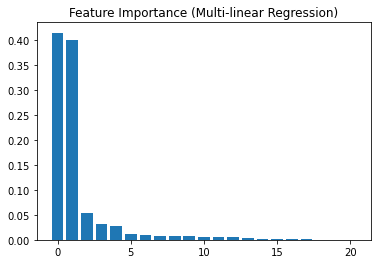

In [34]:
# Multi-linear Regression feature importance
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
plt.title('Feature Importance (Multi-linear Regression)')
plot_feature_imp(linear_model)

In `Multi-linear Regression` model, `Under-five_deaths, Infant_deaths, HIV/AIDS, Schooling, Adult_mortality` show highest feature importance. Besides, coefficients for `Under-five_deaths, HIV/AIDS, Adult_mortality` are negative, which is reasonable. Noticeably, the coefficient of `Infant_deaths` is positive, it may be caused by the high correlation between it  and `Under-five_deaths`.

                      Coefficient  Importance
HIV/AIDS               -23.966984    0.246913
Schooling               14.584606    0.150254
Adult_mortality        -13.820041    0.142377
Under-five_deaths       -6.877095    0.070849
Income_comp              6.167309    0.063537
Diphtheria               4.045886    0.041682
BMI                      3.931672    0.040505
Infant_deaths            3.501598    0.036074
GDP                      3.329394    0.034300
Population               3.288276    0.033877
Percentage_exp           3.113726    0.032078
Polio                    3.071524    0.031644
Thinness_1to19_years    -2.650215    0.027303
Measles                 -2.387336    0.024595
Alcohol                  0.637426    0.006567
Developing              -0.435553    0.004487
Developed                0.435553    0.004487
Year                    -0.275578    0.002839
Total_exp                0.217817    0.002244
Hepatitis_B             -0.204927    0.002111
Thinness_5to9_years      0.123968 

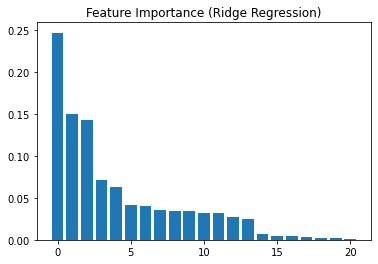

In [35]:
# Ridge Regression feature importance
ridge_model = Ridge()
ridge_model.fit(X_train, y_train)
plt.title('Feature Importance (Ridge Regression)')
plot_feature_imp(ridge_model)

In `Ridge Regression` model, `HIV/AIDS, Schooling, Adult_mortality, Under-five_deaths, Income_comp` show comparatively higher feature importance. Coefficients for `HIV/AIDS, Adult_mortality, Under-five_deaths` are negative and coefficients for ` Schooling, Income_comp` are positive, which is reasonable.

                       Coefficient    Importance
Income_comp           7.524817e+00  7.144172e-01
Developed             3.007987e+00  2.855828e-01
Developing           -1.335852e-15  1.268278e-16
Diphtheria            0.000000e+00  0.000000e+00
Schooling             0.000000e+00  0.000000e+00
Thinness_5to9_years  -0.000000e+00  0.000000e+00
Thinness_1to19_years -0.000000e+00  0.000000e+00
Population           -0.000000e+00  0.000000e+00
GDP                   0.000000e+00  0.000000e+00
HIV/AIDS             -0.000000e+00  0.000000e+00
Year                  0.000000e+00  0.000000e+00
Adult_mortality      -0.000000e+00  0.000000e+00
Polio                 0.000000e+00  0.000000e+00
Under-five_deaths    -0.000000e+00  0.000000e+00
BMI                   0.000000e+00  0.000000e+00
Measles              -0.000000e+00  0.000000e+00
Hepatitis_B           0.000000e+00  0.000000e+00
Percentage_exp        0.000000e+00  0.000000e+00
Alcohol               0.000000e+00  0.000000e+00
Infant_deaths       

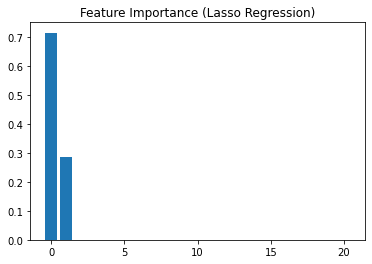

In [36]:
# Lasso Regression feature importance
lasso_model = Lasso()
lasso_model.fit(X_train, y_train)
plt.title('Feature Importance (Lasso Regression)')
plot_feature_imp(lasso_model)

In Lasso Regression model, only `Income_comp, Developed` are picked to build the model with default hyperparameters, which seems unreasonable.

                 Feature    Importance
0               HIV/AIDS  6.021350e-01
1            Income_comp  1.679576e-01
2        Adult_mortality  1.316533e-01
3      Under-five_deaths  2.787737e-02
4              Schooling  1.330366e-02
5                Alcohol  7.871982e-03
6                    BMI  6.645704e-03
7    Thinness_5to9_years  5.655600e-03
8                   Year  5.304079e-03
9              Total_exp  5.255182e-03
10  Thinness_1to19_years  5.133103e-03
11         Infant_deaths  3.967601e-03
12            Population  3.391147e-03
13            Diphtheria  3.106644e-03
14                   GDP  2.491902e-03
15           Hepatitis_B  2.485949e-03
16        Percentage_exp  2.138065e-03
17               Measles  1.872335e-03
18                 Polio  1.753252e-03
19            Developing  4.735499e-07
20             Developed  3.105245e-08


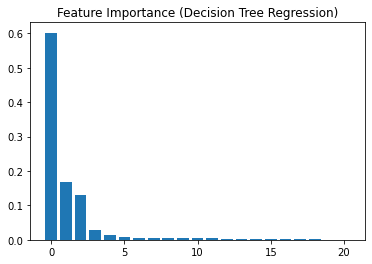

In [37]:
# Decision Tree Regression feature importance
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)
plt.title('Feature Importance (Decision Tree Regression)')
plot_feature_imp(dt_model)

In `Decision Tree Regression` model, `HIV/AIDS, Income_comp, Adult_mortality, Schooling, Under-five_deaths` show comparatively higher feature importance.

                 Feature  Importance
0               HIV/AIDS    0.601897
1            Income_comp    0.173973
2        Adult_mortality    0.114796
3              Schooling    0.018111
4      Under-five_deaths    0.015683
5                    BMI    0.011503
6                Alcohol    0.008923
7          Infant_deaths    0.006769
8                   Year    0.005974
9   Thinness_1to19_years    0.005613
10             Total_exp    0.005393
11   Thinness_5to9_years    0.005268
12               Measles    0.004960
13            Diphtheria    0.003994
14                 Polio    0.003825
15        Percentage_exp    0.003551
16            Population    0.003368
17                   GDP    0.003352
18           Hepatitis_B    0.002842
19             Developed    0.000104
20            Developing    0.000101


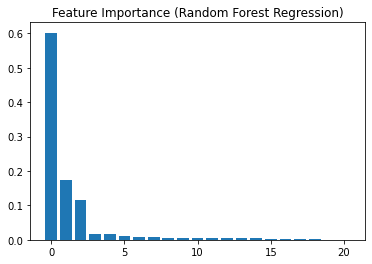

In [38]:
# Random Forest Regression feature importance
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)
plt.title('Feature Importance (Random Forest Regression)')
plot_feature_imp(rf_model)

Similarily, in `Random Forest Regression` model, `HIV/AIDS, Income_comp, Adult_mortality, Schooling, Under-five_deaths, Alcohol` are the top 6 important features.

                 Feature  Importance
0               HIV/AIDS    0.568148
1            Income_comp    0.266459
2      Under-five_deaths    0.040279
3        Adult_mortality    0.037780
4             Diphtheria    0.016459
5              Schooling    0.014150
6    Thinness_5to9_years    0.012599
7              Developed    0.009054
8          Infant_deaths    0.005488
9   Thinness_1to19_years    0.004541
10                 Polio    0.004300
11                   BMI    0.003366
12               Alcohol    0.003282
13        Percentage_exp    0.002287
14             Total_exp    0.002211
15            Population    0.002180
16                   GDP    0.002143
17           Hepatitis_B    0.001931
18                  Year    0.001897
19               Measles    0.001444
20            Developing    0.000000


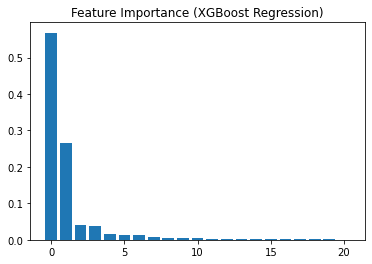

In [39]:
# XGBoost Regression feature importance
xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)
plt.title('Feature Importance (XGBoost Regression)')
plot_feature_imp(xgb_model)

In `XGBoost Regression` model, `HIV/AIDS, Income_comp, Under-five_deaths, Adult_mortality, Diphtheria` are also the top 5 important features.

## 3. Hyperparamter Tuning

Next, we'll fine-tune hyperparameters via `GridSearchCV` or `RandomizedSearchCV` on the `Decision Tree Regression, Random Forest Regression, XGBoost Regression` models, respectively. In the end of this part, we'll compare the 10-Fold Cross Validation RMSE for base models and tuned models.

### Decision Tree Regression

In [40]:
# Create a base model
dt = DecisionTreeRegressor()

# Look at parameters used by the current dt model
print('Parameters currently in use:\n')
pprint(dt.get_params())

Parameters currently in use:

{'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}


In [41]:
# Create the parameter grid based on the results of random search
max_depth = [int(x) for x in np.linspace(1, 50, num = 6)]
max_features = [None, 1, 2, 3, 4, 5]
min_samples_leaf = np.arange(1, 11)

param_grid = {
    'max_depth': max_depth,
    'max_features': max_features ,
    'min_samples_leaf': min_samples_leaf 
}

pprint(param_grid)

{'max_depth': [1, 10, 20, 30, 40, 50],
 'max_features': [None, 1, 2, 3, 4, 5],
 'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])}


In [42]:
# Initiate grid search model
dt_grid = GridSearchCV(estimator = dt, param_grid = param_grid,  
                       cv = 10, scoring='neg_root_mean_squared_error')

# Fit the grid search model
dt_grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 10, 20, 30, 40, 50],
                         'max_features': [None, 1, 2, 3, 4, 5],
                         'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])},
             scoring='neg_root_mean_squared_error')

In [43]:
cv_params = ['mean_test_score', 'std_test_score', 'params']
# Create a dataframe the sort
dt_grid_df = pd.DataFrame(dt_grid.cv_results_).loc[:, cv_params]
dt_grid_df.sort_values(by = 'mean_test_score', ascending= False).head(10)

,mean_test_score,std_test_score,params
243,-2.479319,0.186159,"{'max_depth': 40, 'max_features': None, 'min_s..."
125,-2.488064,0.154677,"{'max_depth': 20, 'max_features': None, 'min_s..."
183,-2.492393,0.188051,"{'max_depth': 30, 'max_features': None, 'min_s..."
305,-2.493147,0.143826,"{'max_depth': 50, 'max_features': None, 'min_s..."
245,-2.493249,0.146134,"{'max_depth': 40, 'max_features': None, 'min_s..."
185,-2.493647,0.151015,"{'max_depth': 30, 'max_features': None, 'min_s..."
124,-2.495949,0.209890,"{'max_depth': 20, 'max_features': None, 'min_s..."
123,-2.499592,0.178056,"{'max_depth': 20, 'max_features': None, 'min_s..."
303,-2.503946,0.198865,"{'max_depth': 50, 'max_features': None, 'min_s..."
184,-2.505336,0.219891,"{'max_depth': 30, 'max_features': None, 'min_s..."


In [44]:
# Best score in grid search
-dt_grid.best_score_

2.479319247555105

In [45]:
# Find the best DT model of the grid search
dt_grid.best_estimator_

DecisionTreeRegressor(max_depth=40, min_samples_leaf=4)

With tuned hyperparameters of `max_depth` and `min_samples_leaf`, the Decision Tree Regression model could get better predicting performance.

### Random Forest Regression

Considering the large number of grid range, we'll use `RandomizedSearchCV` for tuning the Random Forest Regression model.

In [46]:
# Create a base model
rf = RandomForestRegressor()

# Look at parameters used by the current rf model
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [47]:
# Create the parameters for randomized search 
n_estimators = np.arange(100, 501, 50) #[int(x) for x in np.linspace(start = 100, stop = 500, num = 5)]
max_features = np.arange(1, 23)
max_depth = [int(x) for x in np.linspace(1, 100, num =11)]
min_samples_split = np.arange(1, 11)
min_samples_leaf = np.arange(1, 6)

# Create the random grid
param_grid = {'n_estimators': n_estimators,
              'max_features': max_features,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf}
pprint(param_grid)

{'max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22]),
 'min_samples_leaf': array([1, 2, 3, 4, 5]),
 'min_samples_split': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 'n_estimators': array([100, 150, 200, 250, 300, 350, 400, 450, 500])}


In [48]:
# Initiate randomized search model
rf_grid = RandomizedSearchCV(estimator = rf, param_distributions = param_grid,
                            n_iter = 50, cv = 10, random_state=42, n_jobs = -1, scoring='neg_root_mean_squared_error')
# Fit the random search model
rf_grid.fit(X_train, y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'max_depth': [1, 10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100],
                                        'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22]),
                                        'min_samples_leaf': array([1, 2, 3, 4, 5]),
                                        'min_samples_split': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': array([100, 150, 200, 250, 300, 350, 400, 450, 500])},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [49]:
rf_grid_df = pd.DataFrame(rf_grid.cv_results_).loc[:, cv_params]
rf_grid_df.sort_values(by = 'mean_test_score', ascending= False).head(10)

,mean_test_score,std_test_score,params
35,-1.831273,0.147495,"{'n_estimators': 450, 'min_samples_split': 3, ..."
14,-1.836326,0.143902,"{'n_estimators': 200, 'min_samples_split': 3, ..."
9,-1.841641,0.141385,"{'n_estimators': 300, 'min_samples_split': 4, ..."
18,-1.851424,0.137520,"{'n_estimators': 500, 'min_samples_split': 4, ..."
19,-1.860872,0.163954,"{'n_estimators': 150, 'min_samples_split': 3, ..."
6,-1.864001,0.137533,"{'n_estimators': 100, 'min_samples_split': 5, ..."
48,-1.869067,0.167593,"{'n_estimators': 300, 'min_samples_split': 2, ..."
36,-1.890613,0.145036,"{'n_estimators': 100, 'min_samples_split': 7, ..."
37,-1.895513,0.139259,"{'n_estimators': 450, 'min_samples_split': 5, ..."
40,-1.901379,0.147076,"{'n_estimators': 350, 'min_samples_split': 3, ..."


In [50]:
-rf_grid.best_score_

1.8312733011713795

In [51]:
# Find the best RF model of randomized search
rf_grid.best_estimator_

RandomForestRegressor(max_depth=60, max_features=15, min_samples_split=3,
                      n_estimators=450)

With tuned hyperparameters of `max_depth, max_features=15, min_samples_split, n_estimators`, the Random Forest Regression model could get better predicting performance.

### XGBoost regression

In [52]:
# Create a base model
XGB = XGBRegressor(objective='reg:squarederror')

# Look at parameters used by the current xgb model
print('Parameters currently in use:\n')
pprint(XGB.get_params())

Parameters currently in use:

{'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'gamma': None,
 'gpu_id': None,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'objective': 'reg:squarederror',
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}


In [53]:
# Create the parameter grid based on the results of random search
param_grid = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'min_child_weight': np.arange(0.01, 1.01, 0.01),
              'gamma': np.arange(0.0, 40.0, 0.005),
              'learning_rate': np.arange(0.001,0.3,0.001),
              'subsample': np.arange(0.01, 1.01, 0.01),
              'colsample_bylevel': np.arange(0.1, 1.1, 0.1),
              'colsample_bytree': np.arange(0.1, 1.1, 0.1)}

pprint(param_grid)

{'colsample_bylevel': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 'colsample_bytree': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 'gamma': array([0.0000e+00, 5.0000e-03, 1.0000e-02, ..., 3.9985e+01, 3.9990e+01,
       3.9995e+01]),
 'learning_rate': array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009,
       0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017, 0.018,
       0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026, 0.027,
       0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035, 0.036,
       0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044, 0.045,
       0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053, 0.054,
       0.055, 0.056, 0.057, 0.058, 0.059, 0.06 , 0.061, 0.062, 0.063,
       0.064, 0.065, 0.066, 0.067, 0.068, 0.069, 0.07 , 0.071, 0.072,
       0.073, 0.074, 0.075, 0.076, 0.077, 0.078, 0.079, 0.08 , 0.081,
       0.082, 0.083, 0.084, 0.085, 0.086, 0.087, 0.088, 0.089, 0.09 ,
       0.091, 0.09

In [54]:
# Initiate random search model
XGB_grid = RandomizedSearchCV(estimator = XGB, param_distributions = param_grid,
                                n_iter = 100, cv = 10, random_state=42, n_jobs = -1, scoring='neg_root_mean_squared_error')

# Fit the random search model
XGB_grid.fit(X_train, y_train)

RandomizedSearchCV(cv=10,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100,...
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.

In [55]:
XGB_grid_df = pd.DataFrame(XGB_grid.cv_results_).loc[:, cv_params]
XGB_grid_df.sort_values(by = 'mean_test_score', ascending= False).head(10)

,mean_test_score,std_test_score,params
78,-1.829568,0.137459,"{'subsample': 0.93, 'min_child_weight': 0.85, ..."
37,-1.871282,0.145445,"{'subsample': 0.91, 'min_child_weight': 0.26, ..."
31,-1.905123,0.128267,"{'subsample': 0.98, 'min_child_weight': 0.12, ..."
46,-1.928714,0.118427,"{'subsample': 0.61, 'min_child_weight': 0.05, ..."
15,-1.928987,0.101298,"{'subsample': 0.74, 'min_child_weight': 0.5, '..."
94,-1.937051,0.125127,"{'subsample': 0.81, 'min_child_weight': 0.34, ..."
62,-1.971940,0.112057,"{'subsample': 0.56, 'min_child_weight': 0.64, ..."
39,-1.973968,0.116691,"{'subsample': 0.48000000000000004, 'min_child_..."
51,-1.986060,0.122701,"{'subsample': 0.87, 'min_child_weight': 0.4, '..."
34,-1.987460,0.102109,"{'subsample': 0.62, 'min_child_weight': 0.1800..."


In [56]:
-XGB_grid.best_score_

1.8295684955207367

In [57]:
# Find the best DT model of the grid search
XGB_grid.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.5,
             colsample_bynode=1, colsample_bytree=0.9, gamma=1.495, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.117, max_delta_step=0, max_depth=11,
             min_child_weight=0.85, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.93,
             tree_method='exact', validate_parameters=1, verbosity=None)

With tuned hyperparameters, the SGBoost Regression model also get better predicting performance, which is matcheable to that of Random Forest Regression.

### Comparison

Let's compare these three top models, with both base model RMSE and tuned RMSE. From the table, we could say that after hyperparameter tuning, **Random Forest Regression** and **XGBoost Regression** models perform the best.

In [58]:
model_lst = []
based_rmse = []
for model in [DecisionTreeRegressor, RandomForestRegressor, XGBRegressor]:
    model_lst.append(model.__name__)
    if model == XGBRegressor:
        based_rmse.append(rmse_cv(XGBRegressor(objective='reg:squarederror')).mean())                          
    else:
        based_rmse.append(rmse_cv(model()).mean()) 
        
tuned_rmse = [-dt_grid.best_score_, -rf_grid.best_score_, -XGB_grid.best_score_]
model_df = pd.DataFrame(list(zip(model_lst, based_rmse, tuned_rmse)), 
               columns =['Model', 'Base RMSE', 'Tuned RMSE']) 
model_df

,Model,Base RMSE,Tuned RMSE
0,DecisionTreeRegressor,2.770174,2.479319
1,RandomForestRegressor,1.872114,1.831273
2,XGBRegressor,1.956808,1.829568


## 4. Model Evaluation

Finally, we'll measure the performance on the test set to estimate the generalization error for these three models. Also, we'll have a look at the feature importance of each model respectively.

### Decision Tree Regression

In [59]:
# Decision Tree Regression 
dt_params = dt_grid.best_params_
dt_model = DecisionTreeRegressor(max_depth = dt_params['max_depth'],
                                 max_features = dt_params['max_features'], 
                                 min_samples_leaf = dt_params['min_samples_leaf'],
                                 random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))
r2_dt = r2_score(y_test, y_pred_dt)
print('Decision Tree Regression: RMSE = %f, R-Squared = %f' % (rmse_dt, r2_dt))

Decision Tree Regression: RMSE = 2.226168, R-Squared = 0.942650


                 Feature  Importance
0               HIV/AIDS    0.609980
1            Income_comp    0.171363
2        Adult_mortality    0.132932
3      Under-five_deaths    0.028510
4              Schooling    0.010074
5                Alcohol    0.008126
6   Thinness_1to19_years    0.004988
7                   Year    0.004972
8                    BMI    0.004739
9    Thinness_5to9_years    0.004433
10             Total_exp    0.004232
11            Diphtheria    0.003471
12            Population    0.002590
13        Percentage_exp    0.001780
14         Infant_deaths    0.001611
15                 Polio    0.001520
16           Hepatitis_B    0.001368
17                   GDP    0.001321
18               Measles    0.001197
19            Developing    0.000792
20             Developed    0.000000


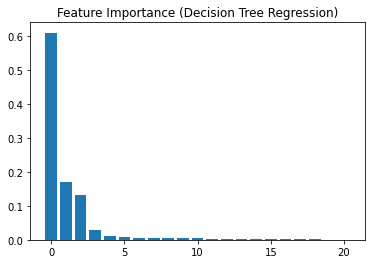

In [60]:
plt.title('Feature Importance (Decision Tree Regression)')
plot_feature_imp(dt_model)

`HIV/AIDS, Income_comp, Adult_mortality, Under-five_deaths` are the most importat features.

### Random Forest Regression

In [61]:
# Random Forest Regression feature importance
rf_params = rf_grid.best_params_
rf_model = RandomForestRegressor(max_depth=rf_params['max_depth'], 
                                 max_features=rf_params['max_features'],
                                 n_estimators=rf_params['n_estimators'], random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)
print('Forest Regression: RMSE = %f, R-Squared = %f' % (rmse_rf, r2_rf))

Forest Regression: RMSE = 1.737004, R-Squared = 0.965084


                 Feature  Importance
0               HIV/AIDS    0.479867
1            Income_comp    0.235959
2        Adult_mortality    0.137931
3              Schooling    0.041508
4      Under-five_deaths    0.018540
5                    BMI    0.012758
6    Thinness_5to9_years    0.009407
7          Infant_deaths    0.009380
8                Alcohol    0.008453
9                   Year    0.006691
10  Thinness_1to19_years    0.006653
11             Total_exp    0.005863
12                 Polio    0.004728
13                   GDP    0.004012
14            Diphtheria    0.003928
15        Percentage_exp    0.003624
16            Population    0.003481
17           Hepatitis_B    0.003109
18               Measles    0.002938
19             Developed    0.000759
20            Developing    0.000410


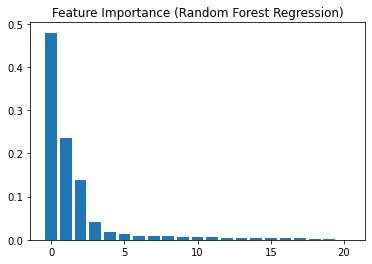

In [62]:
plt.title('Feature Importance (Random Forest Regression)')
plot_feature_imp(rf_model)

`HIV/AIDS, Income_comp, Adult_mortality, Schooling, Under-five_deaths, BMI` show comparatively higher feature importance.

### XGBoost Regression

In [63]:
# XGBoost Regression feature importance
xgb_params = XGB_grid.best_params_
xgb_model = XGBRegressor(colsample_bylevel=xgb_params['colsample_bylevel'],
                         colsample_bytree=xgb_params['colsample_bytree'],
                         gamma=xgb_params['gamma'],
                         learning_rate=xgb_params['learning_rate'],
                         max_depth=xgb_params['max_depth'],
                         min_child_weight=xgb_params['min_child_weight'],
                         subsample =xgb_params['subsample'],
                          random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb = r2_score(y_test, y_pred_xgb)
print('XGBoost Regression: RMSE = %f, R-Squared = %f' % (rmse_xgb, r2_xgb))

XGBoost Regression: RMSE = 1.779746, R-Squared = 0.963345


                 Feature  Importance
0               HIV/AIDS    0.302505
1            Income_comp    0.299269
2              Schooling    0.076177
3        Adult_mortality    0.069409
4                    BMI    0.054724
5              Developed    0.049030
6      Under-five_deaths    0.034592
7          Infant_deaths    0.027720
8                  Polio    0.023616
9    Thinness_5to9_years    0.020637
10            Diphtheria    0.009373
11            Developing    0.005489
12  Thinness_1to19_years    0.005260
13               Alcohol    0.004338
14        Percentage_exp    0.003322
15                  Year    0.003103
16             Total_exp    0.002965
17            Population    0.002299
18           Hepatitis_B    0.002118
19                   GDP    0.002071
20               Measles    0.001983


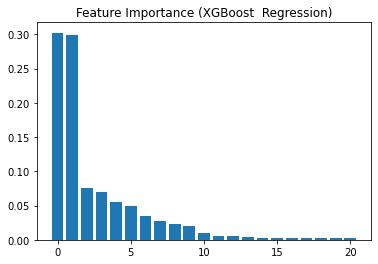

In [64]:
plt.title('Feature Importance (XGBoost  Regression)')
plot_feature_imp(xgb_model)

`HIV/AIDS, Income_comp` show extremely higher feature importance, `Schooling, Adult_mortality, BMI, Developed, Under-five_deaths` also show comparatively higher importance.

## 5. Result Analysis

Here, we can see the performance results for 10-Fold CV on train data as well test data. **Random Forest Regression** model performs best on test data, meaning leading to comparatively less generalization error. Thereby, we could consider using this model (with tuned hyperparameters) in the future to predict life expectancy.

In [65]:
test_rmse = [rmse_dt, rmse_rf, rmse_xgb]
test_r2 = [r2_dt, r2_rf, r2_xgb]
result_df = pd.DataFrame(list(zip(model_lst, tuned_rmse, test_rmse, test_r2)), 
               columns =['Model', '10-Fold CV RMSE', 'Test RMSE', 'Test R-Squared']) 
result_df

,Model,10-Fold CV RMSE,Test RMSE,Test R-Squared
0,DecisionTreeRegressor,2.479319,2.226168,0.942650
1,RandomForestRegressor,1.831273,1.737004,0.965084
2,XGBRegressor,1.829568,1.779746,0.963345


In comparing the feature importance result for these three regression models, we could also find that the following show comparatively higher importance:
- `HIV/AIDS`
- `Income_comp`
- `Adult_mortality`
- `Under-five_deaths`
- `Schooling`
- `BMI`

Recall the intersted problems we brought up in the introduction, we'll explore the relationship between `Life_expectancy` and important features, together with other features of interest, based on the original data.

In [66]:
# Define a function to make a scatter plot
def plot_scatter(data_select):
    '''
    Takes in the column to visualize the relationship between life_expectancy and it
    Outputs a scatter plot, grouped by developing status
    '''
    fig = px.scatter(cleaned_df, x = data_select, y = 'Life_expectancy', color = 'Status')  # , trendline='lowess'
    fig['layout'].update(width=700, height=350)
    fig.update_layout(title= 'Life Expectancy vs. '+data_select)
    fig.show()

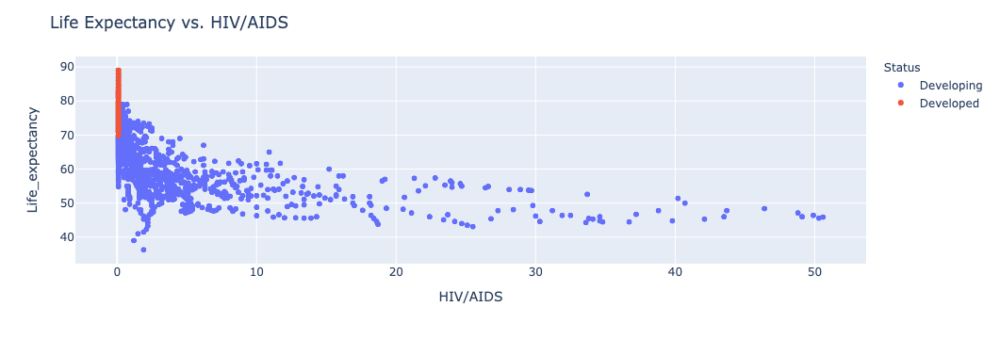

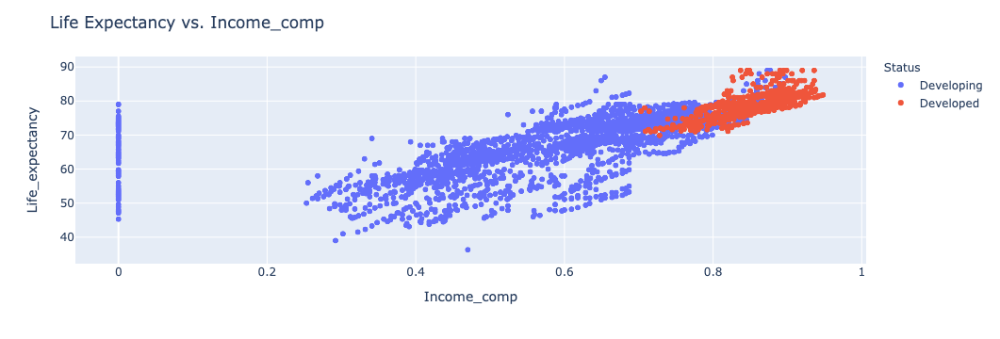

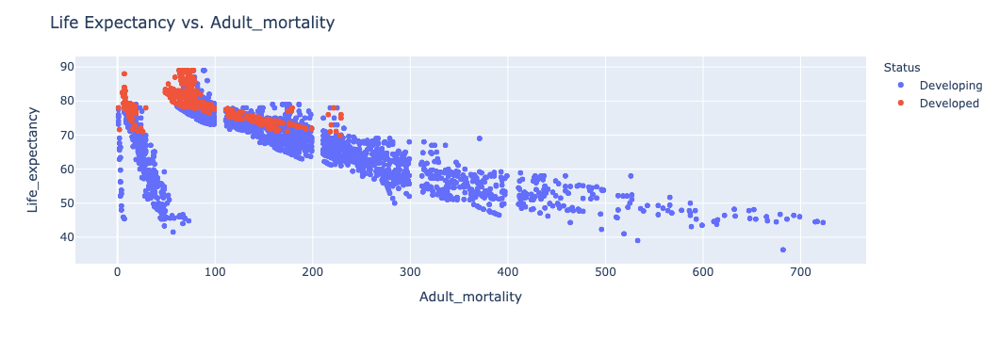

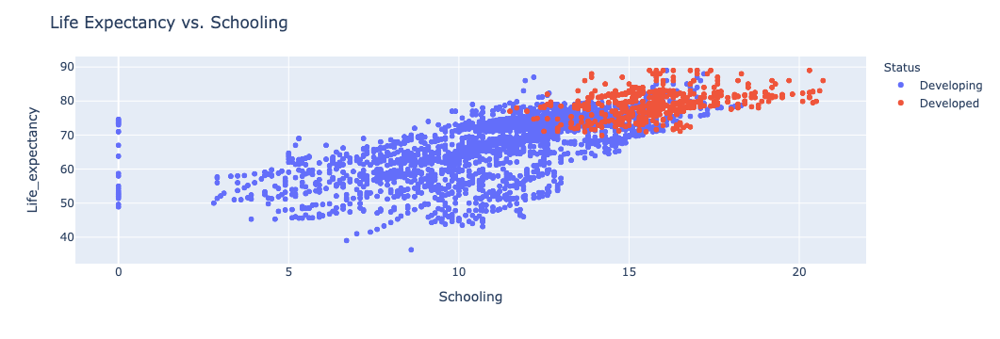

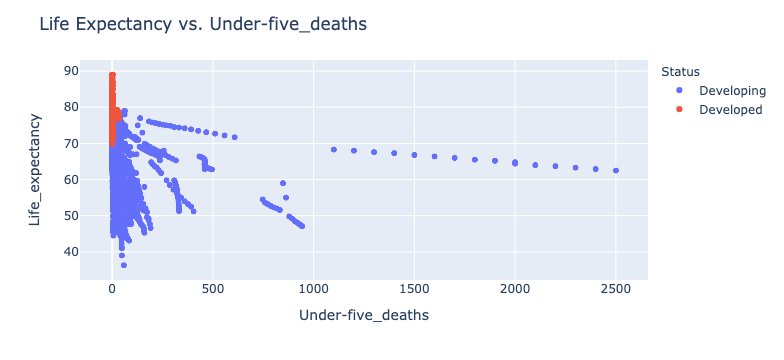

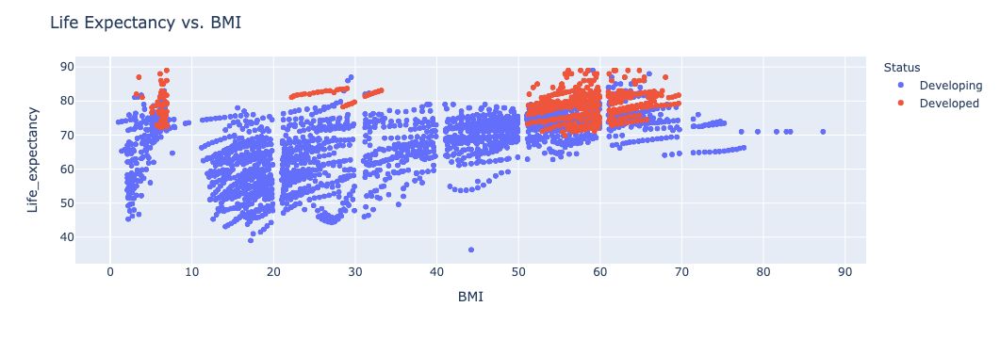

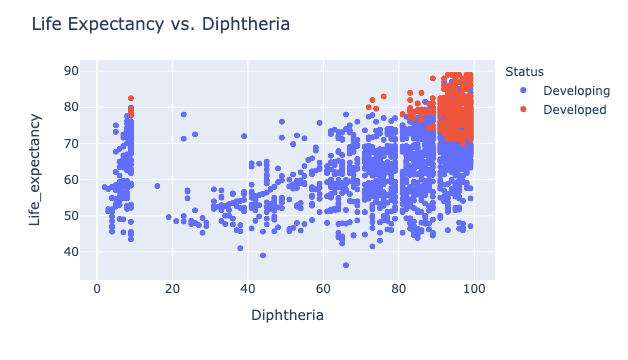

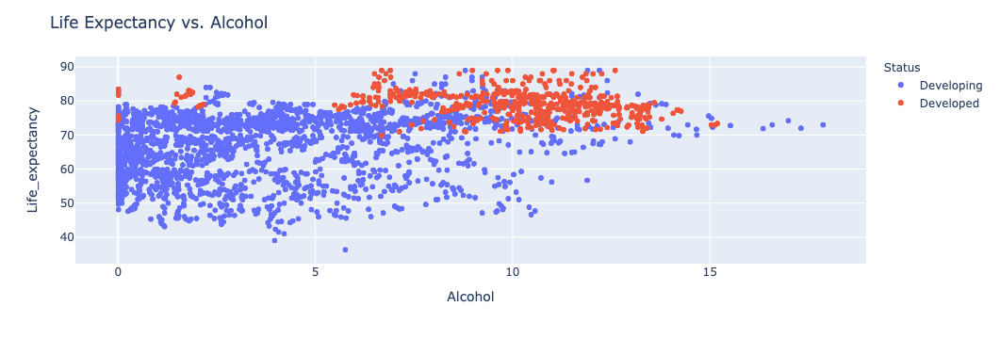

In [67]:
# Select features of interest
top_features = ['HIV/AIDS', 'Income_comp', 'Adult_mortality', 'Schooling', 'Under-five_deaths', 'BMI', 'Diphtheria', 'Alcohol']

for feature in top_features: 
    plot_scatter(feature) 

From the plots above, we could find insights on:

- **Impact of schooling on life expectancy:** <br>
Generally, there exists a `positive` relationship between schooling and life expectancy, both in developed and developing countries. We can also observe the gap in average number of years of schooling between these two types of countries. 

- **Impact of immunization coverage on life expectancy:**<br>
`Higher` immunization rate/coverage tends to lead to a `higher` life expectancy, based on the observation of immunization rate of diphtheria on 1-year olds. Similarily, while developed countries commonly have higher immunization coverage, developing countries show a different pattern - huge immunization gap exists.

- **Impact of mortality rates on life expectancy**:<br>
As expected, the mortality rates `negatively` affects life span, which can be observed from `Adult_mortality` and `Under-five_deaths`.

# Recommendations

Based on our model results and analysis, we propose the following recommendations, hoping to provide suggestions for countries on effectively helping people live longer with appropriate policy implementations, as well as for international organizations to consider how to shorten the gap between developed and developing countries. We illustrate through three aspects:

**`Healthcare`**
- **Expand Immunization Coverage:** Spent more expenditure on public health fixture and immunization expansion to imporve immuzation rate among population.
- **Raise Awareness:** Improve people’s awareness of diseases and educate them on prevention, helping people to lead a healthy life style and form better habits.
 
**`Human Development`**
- **Reallocate Budget:** Re-allocate the government budget to prioritize social needs. With limited government budget, consider how to reasonably allocate and guarantee the development of employment market, infrastructures, and other social goods.
- **Reallocate Resources:** Allocate more social resources on public welfare.

**`Education`**
- **Enforce Education:** Guarantee the chance of education for child and teens, such as reducing the cost of education through goverment's expenditure.
- **International Organization Sponsored Projects:** United Nations, World Bank, etc. to finance education projects and establish funds especially in countries with lower level of education and difficulty in developing education. Other NGOs could also help in mitigating the global gap.

# Future Work

Some work could be taken in the future to improve our prediction results.

**`Data`**
- **Add data from year 2016-2020 into training data:** The current data is for 2000 - 2015, with more recent data, the model could be better fitted.
- **Capture more features on various aspects:** Such as (un)eployment, happiness index.
- **Find out the reason of invalid/missing values**

**`Imputation`**
- **Experiment with more advanced imputation techniques** other than the standard mean and median method.

**`Model`**
- **Clustering the results to see more insights:** As we planned and attempted before, we hope to map the similarity and gap among countries through clustering algorithms. Considering the completeness of the project and the additional work for exploring clustering, we didn't go further currently, which can be done in the future.